In [2]:
from IPython.display import display, HTML, Image
display(HTML("<style>.container { width:95% !important; }</style>"))

%load_ext autoreload
%autoreload 2

import os
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import json

from matplotlib import cm
import matplotlib.pyplot as plt

import sys
sys.path.append("../../lib")
from stpalette import palette_WM4007_rna, palette_WM4237_rna
from plots import plotSpatialAll
from sankey import makeSankeyDiagram, getCountsDataframe
from utils import loadAdImage

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
model = 'WM4237'
palette_rna = palette_WM4007_rna if model=='WM4007' else palette_WM4237_rna

In [4]:
ncols = 6

In [5]:
preprocessedStDataPath = 'd:/from HPCC 11 28 2022/results_NF1-nod-t2t-k35/%s/' % model
preprocessedImStDataPath = 'd:/from HPCC 11 28 2022/results_NF2/%s_ST/' % model
preprocessedImAdDataPath = 'd:/from HPCC 11 28 2022/results_NF2/%s_3_AD_m/' % model

dataPath = '../../data/'

ids = sorted(np.loadtxt(dataPath + 'ids_%s_ST.txt' % model, dtype=str))
ids = [id for id in ids if not '_TE_' in id]
print(ids)

ids_ad = sorted(np.loadtxt(dataPath + 'ids_%s_AD.txt' % model, dtype=str))
ids_ad = [id for id in ids_ad if not '_TE_' in id]
print(ids_ad)

['WM4237_T0_S1_ST', 'WM4237_T0_S2_ST', 'WM4237_T1_S1_ST', 'WM4237_T1_S2_ST', 'WM4237_T2_S1_ST', 'WM4237_T2_S2_ST', 'WM4237_T3_S1_ST', 'WM4237_T3_S2_ST', 'WM4237_T4_S1_ST', 'WM4237_T4_S2_ST', 'WM4237_TC_S1_ST', 'WM4237_TC_S2_ST']
['WM4237_T0_S1_AD', 'WM4237_T0_S2_AD', 'WM4237_T1_S1_AD', 'WM4237_T1_S2_AD', 'WM4237_T2_S1_AD', 'WM4237_T2_S2_AD', 'WM4237_T3_S1_AD', 'WM4237_T3_S2_AD', 'WM4237_T4_S1_AD', 'WM4237_T4_S2_AD', 'WM4237_TC_S1_AD', 'WM4237_TC_S2_AD']


### AD

##### Load imaging data

In [6]:
ads = dict()
for sample in ids_ad:
    df_temp = pd.read_csv(preprocessedImAdDataPath + '%s/data.csv.gz' % sample, index_col=[0,1]).xs(1, level='in_tissue')
    df_temp.insert(0, 'original_barcode', df_temp.index.values)
    ads.update({sample: sc.AnnData(X=df_temp.loc[:, df_temp.columns.str.contains('feat')],
                                   obs=df_temp.loc[:, ~df_temp.columns.str.contains('feat')])})
    
ad_im_ad_all = sc.concat(ads, label='sample', join='outer', index_unique ='-')
ad_im_ad_all

AnnData object with n_obs × n_vars = 15872 × 2048
    obs: 'original_barcode', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'pxl_row_in_wsi', 'pxl_col_in_wsi', 'density_connective', 'density_inflammatory', 'density_necrosis', 'density_neoplasia', 'density_no_label', 'density_no_neoplasia', 'count_connective', 'count_inflammatory', 'count_necrosis', 'count_neoplasia', 'count_no_label', 'count_no_neoplasia', 'total_count', 'average_perimeter_length_connective', 'average_perimeter_length_inflammatory', 'average_perimeter_length_necrosis', 'average_perimeter_length_neoplasia', 'average_perimeter_length_no_label', 'average_perimeter_length_no_neoplasia', 'std_perimeter_length_connective', 'std_perimeter_length_inflammatory', 'std_perimeter_length_necrosis', 'std_perimeter_length_neoplasia', 'std_perimeter_length_no_label', 'std_perimeter_length_no_neoplasia', 'average_perimeter_length', 'std_perimeter_length', 'average_area_connective', 'average_area_inflammatory', 

##### Inception features UMAP and clustering

In [9]:
sc.pp.highly_variable_genes(ad_im_ad_all, flavor='seurat', batch_key='sample', n_top_genes=250)
print(ad_im_ad_all.var['highly_variable'].sum())
sc.pp.pca(ad_im_ad_all, n_comps=30, zero_center=True, use_highly_variable=True)

if True:
    sce.pp.harmony_integrate(ad_im_ad_all, 'sample', lamb=1.0)
    sc.pp.neighbors(ad_im_ad_all, use_rep='X_pca_harmony')
    sc.tl.umap(ad_im_ad_all)
    sc.tl.leiden(ad_im_ad_all, key_added='cluster_harmonized', resolution=0.75)
    
if True:
    sc.pp.neighbors(ad_im_ad_all, use_rep='X_pca')
    sc.tl.umap(ad_im_ad_all)
    sc.tl.leiden(ad_im_ad_all, key_added='cluster', resolution=0.75)

250


2023-06-05 09:16:30,546 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-06-05 09:16:33,151 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-06-05 09:16:33,281 - harmonypy - INFO - Iteration 1 of 10
2023-06-05 09:16:39,483 - harmonypy - INFO - Iteration 2 of 10
2023-06-05 09:16:45,435 - harmonypy - INFO - Iteration 3 of 10
2023-06-05 09:16:51,786 - harmonypy - INFO - Iteration 4 of 10
2023-06-05 09:16:59,396 - harmonypy - INFO - Iteration 5 of 10
2023-06-05 09:17:04,515 - harmonypy - INFO - Iteration 6 of 10
2023-06-05 09:17:08,702 - harmonypy - INFO - Iteration 7 of 10
2023-06-05 09:17:11,896 - harmonypy - INFO - Iteration 8 of 10
2023-06-05 09:17:15,231 - harmonypy - INFO - Iteration 9 of 10
2023-06-05 09:17:18,512 - harmonypy - INFO - Iteration 10 of 10
2023-06-05 09:17:21,785 - harmonypy - INFO - Stopped before convergence


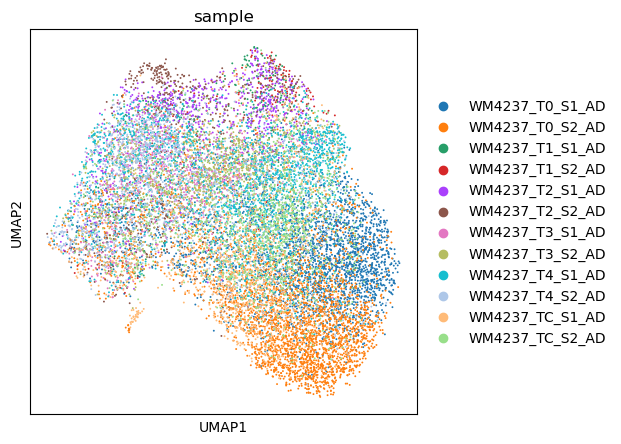

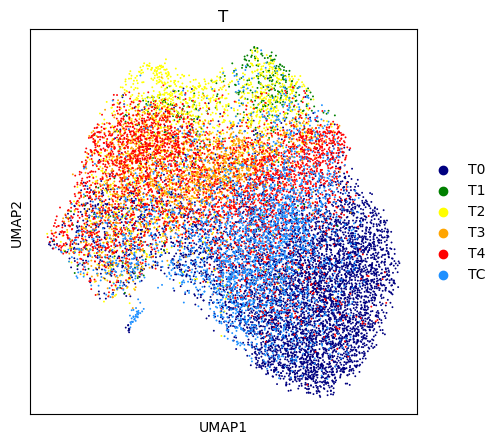

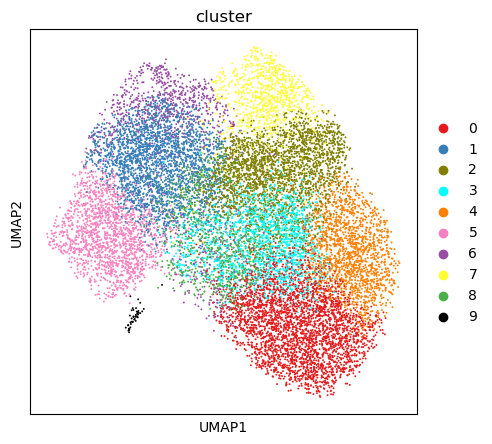

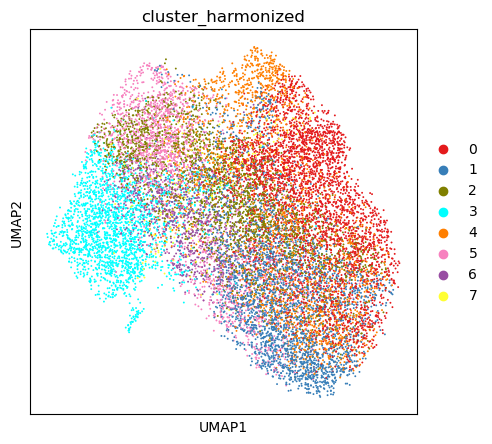

In [10]:
plt.rcParams["figure.figsize"] = (5,5)
sc.pl.umap(ad_im_ad_all, color=['sample'])

ad_im_ad_all.obs['T'] = ad_im_ad_all.obs['sample'].str.split('_', expand=True)[1]
sc.pl.umap(ad_im_ad_all, color=['T'], palette=palette_rna)

sc.pl.umap(ad_im_ad_all, color=['cluster'], palette=palette_rna)
sc.pl.umap(ad_im_ad_all, color=['cluster_harmonized'], palette=palette_rna)

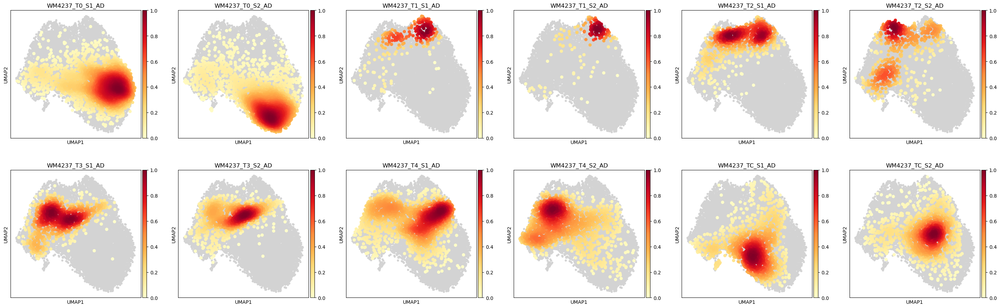

In [11]:
identity = 'sample'
sc.tl.embedding_density(ad_im_ad_all, basis='umap', groupby=identity)
sc.pl.embedding_density(ad_im_ad_all, groupby=identity, ncols=ncols)

##### Load AD images and tile coordinates

In [7]:
images = {sample: loadAdImage(preprocessedImAdDataPath + sample) for sample in ids_ad}

ad_im_ad_all.obs['count_connective'] = ad_im_ad_all.obs['count_connective'].fillna(0).astype(int)
ad_im_ad_all.obs['count_neoplasia'] = ad_im_ad_all.obs['count_neoplasia'].fillna(0).astype(int)

ads_ad = dict()
for sample in ids_ad[:]:
    ads_ad[sample] = ad_im_ad_all[ad_im_ad_all.obs['sample']==sample, :].copy()    
    ads_ad[sample].uns['spatial'] = images[sample][0]
    ads_ad[sample].obsm['spatial'] = pd.DataFrame(index=images[sample][1], data=images[sample][2]).reindex(ads_ad[sample].obs['original_barcode']).values

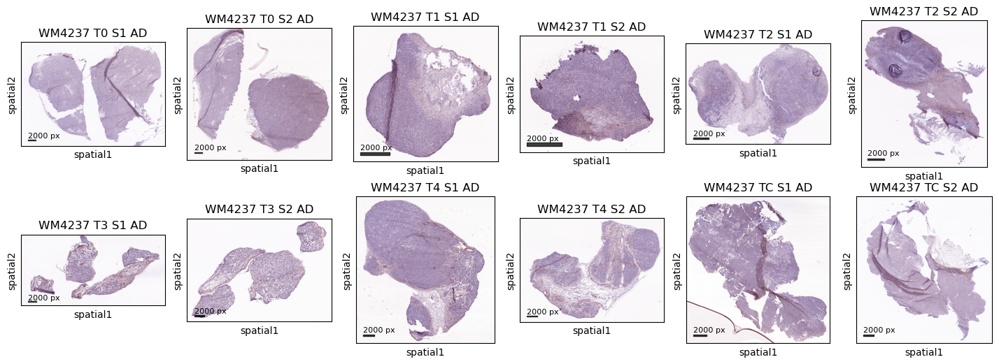

In [38]:
plotSpatialAll(ads_ad, nx=ncols, f=0.6)

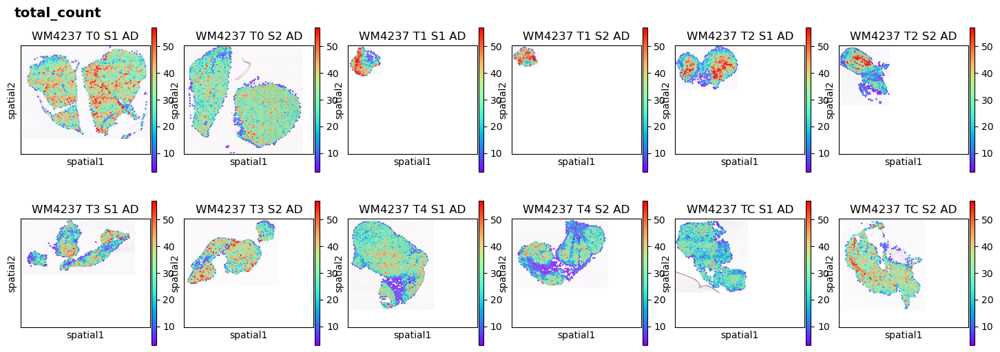

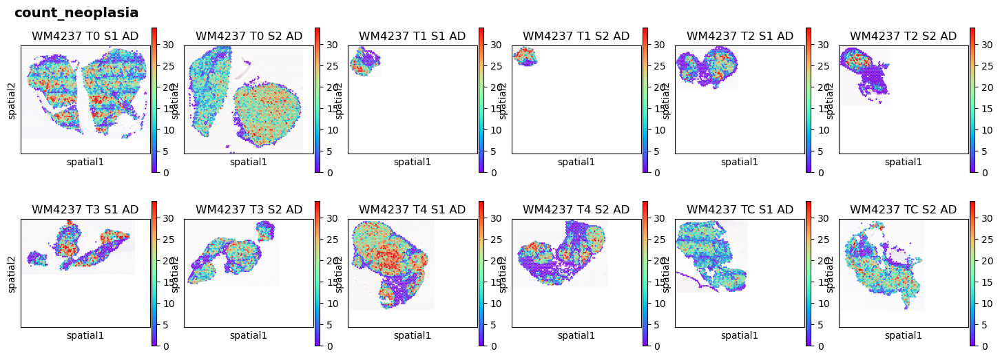

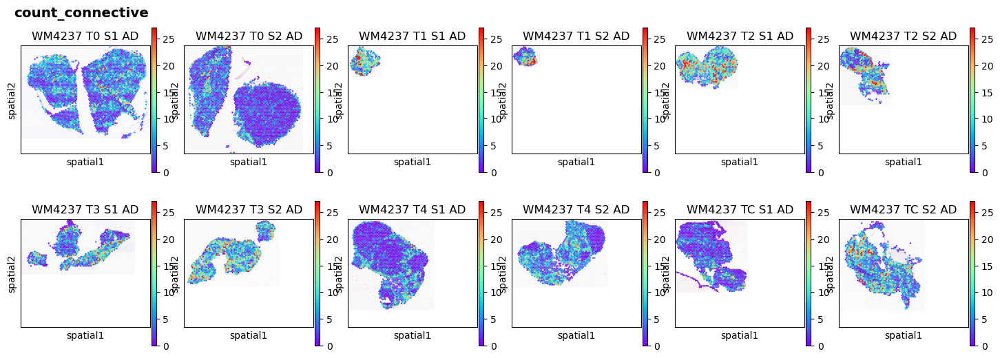

In [9]:
plotSpatialAll(ads_ad, identity='total_count', nx=ncols, f=0.6, maintainScale=True)
plotSpatialAll(ads_ad, identity='count_neoplasia', nx=ncols, f=0.6, maintainScale=True)
plotSpatialAll(ads_ad, identity='count_connective', nx=ncols, f=0.6, maintainScale=True)

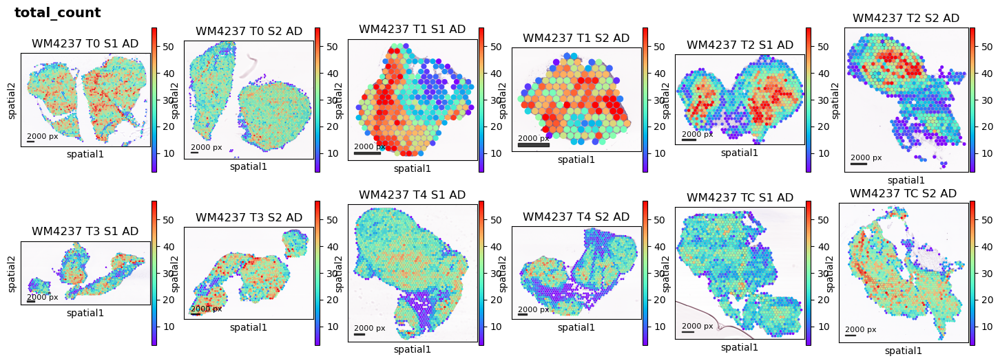

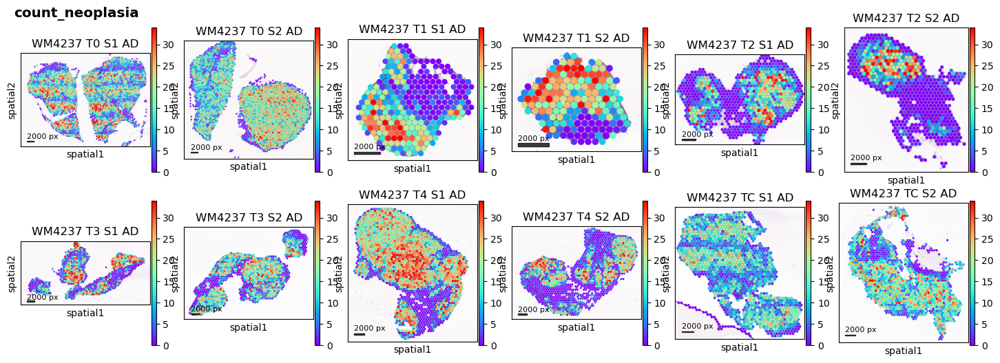

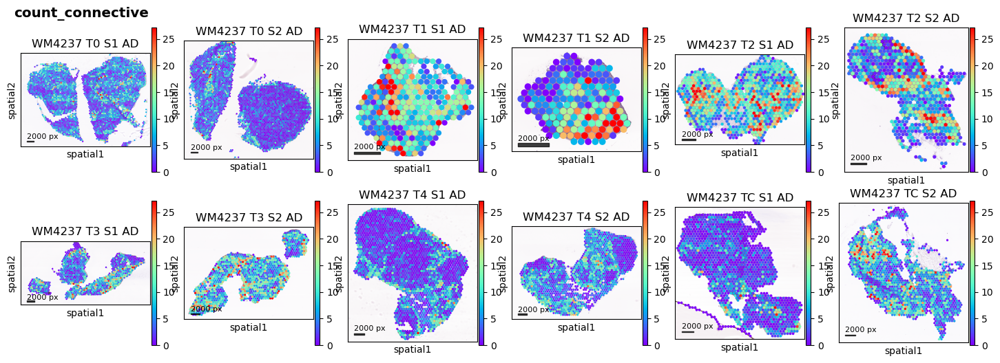

In [40]:
plotSpatialAll(ads_ad, identity='total_count', nx=ncols, maintainScale=False, f=0.6)
plotSpatialAll(ads_ad, identity='count_neoplasia', nx=ncols, f=0.6)
plotSpatialAll(ads_ad, identity='count_connective', nx=ncols, f=0.6)

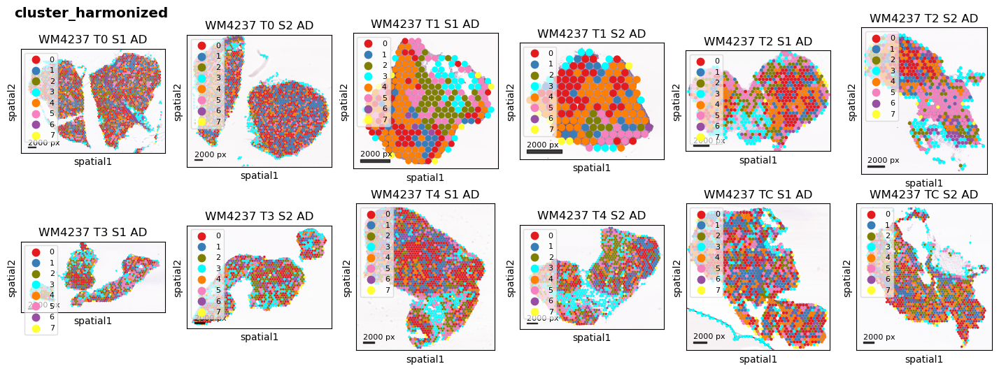

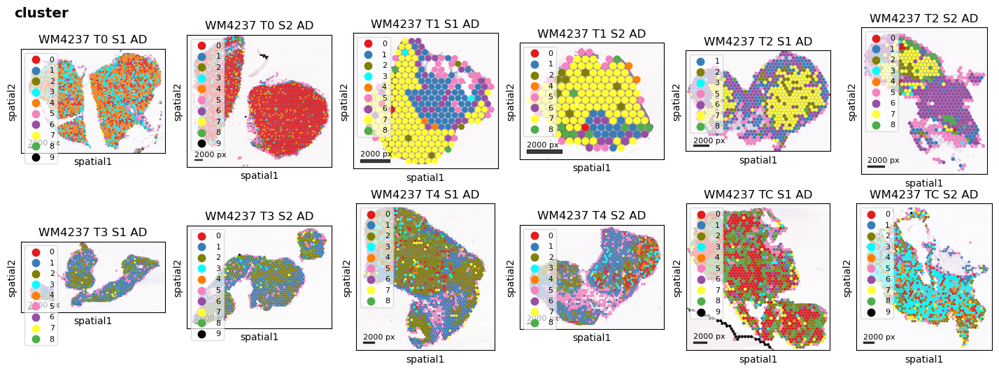

In [42]:
plotSpatialAll(ads_ad, identity='cluster_harmonized', nx=ncols, maintainScale=False, palette=palette_rna, f=0.6)
plotSpatialAll(ads_ad, identity='cluster', nx=ncols, maintainScale=False, palette=palette_rna, f=0.6)

###### Save AnnData object

In [43]:
ad_im_ad_all.write(dataPath + 'ad_all_human_clustered_im_ad_%s_m.h5ad' % model)

### ST

In [53]:
ads = dict()
for sample in ids:
    df_temp = pd.read_csv(preprocessedImStDataPath + '%s/data.csv.gz' % sample, index_col=[0,1]).xs(1, level='in_tissue')
    df_temp.insert(0, 'original_barcode', df_temp.index.values)
    ads.update({sample: sc.AnnData(X=df_temp.loc[:, df_temp.columns.str.contains('feat')],
                                   obs=df_temp.loc[:, ~df_temp.columns.str.contains('feat')])})
    
ad_im_all = sc.concat(ads, label='sample', join='outer', index_unique ='-')
ad_im_all

AnnData object with n_obs × n_vars = 15447 × 2048
    obs: 'original_barcode', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'pxl_row_in_wsi', 'pxl_col_in_wsi', 'density_connective', 'density_inflammatory', 'density_necrosis', 'density_neoplasia', 'density_no_label', 'density_no_neoplasia', 'count_connective', 'count_inflammatory', 'count_necrosis', 'count_neoplasia', 'count_no_label', 'count_no_neoplasia', 'total_count', 'average_perimeter_length_neoplasia', 'average_perimeter_length_no_label', 'average_perimeter_length_connective', 'average_perimeter_length_inflammatory', 'average_perimeter_length_necrosis', 'average_perimeter_length_no_neoplasia', 'average_perimeter_length', 'std_perimeter_length', 'average_area_neoplasia', 'average_area_no_label', 'average_area_connective', 'average_area_inflammatory', 'average_area_necrosis', 'average_area_no_neoplasia', 'average_area', 'std_area', 'average_orientation_neoplasia', 'average_orientation_no_label', 'average_or

In [54]:
sc.pp.highly_variable_genes(ad_im_all, flavor='seurat', batch_key='sample', n_top_genes=250)
print(ad_im_all.var['highly_variable'].sum())
sc.pp.pca(ad_im_all, n_comps=30, zero_center=True, use_highly_variable=True)

if True:
    sce.pp.harmony_integrate(ad_im_all, 'sample', lamb=1.0)
    sc.pp.neighbors(ad_im_all, use_rep='X_pca_harmony')
    sc.tl.umap(ad_im_all)
    sc.tl.leiden(ad_im_all, key_added='cluster_harmonized', resolution=0.75)
    
if True:
    sc.pp.neighbors(ad_im_all, use_rep='X_pca')
    sc.tl.umap(ad_im_all)
    sc.tl.leiden(ad_im_all, key_added='cluster', resolution=0.75)

2023-06-05 09:49:55,907 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


250


2023-06-05 09:50:00,040 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-06-05 09:50:00,198 - harmonypy - INFO - Iteration 1 of 10
2023-06-05 09:50:07,284 - harmonypy - INFO - Iteration 2 of 10
2023-06-05 09:50:14,225 - harmonypy - INFO - Iteration 3 of 10
2023-06-05 09:50:21,010 - harmonypy - INFO - Iteration 4 of 10
2023-06-05 09:50:25,139 - harmonypy - INFO - Iteration 5 of 10
2023-06-05 09:50:28,955 - harmonypy - INFO - Iteration 6 of 10
2023-06-05 09:50:32,497 - harmonypy - INFO - Iteration 7 of 10
2023-06-05 09:50:35,440 - harmonypy - INFO - Iteration 8 of 10
2023-06-05 09:50:38,411 - harmonypy - INFO - Converged after 8 iterations


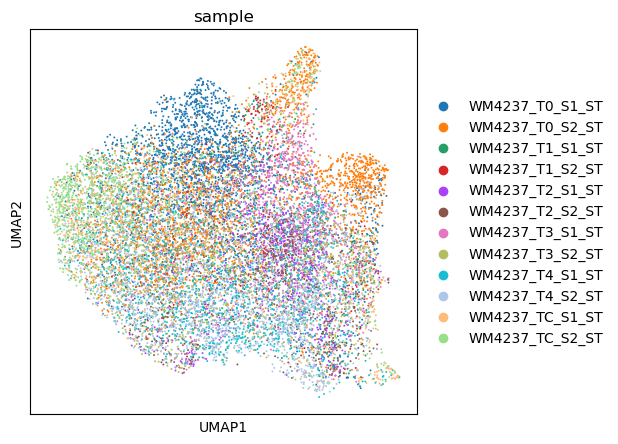

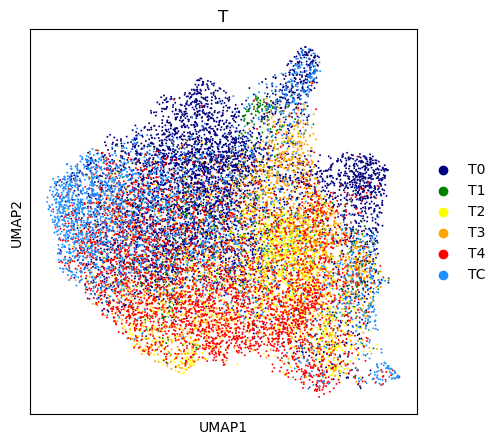

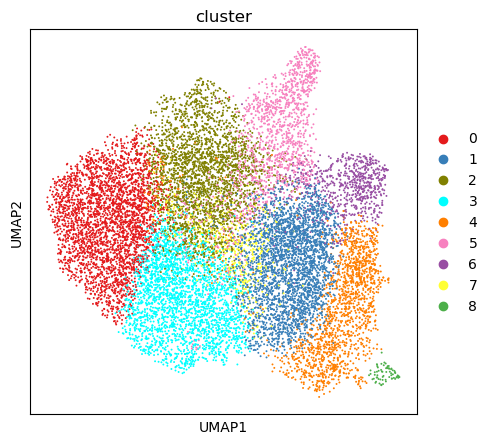

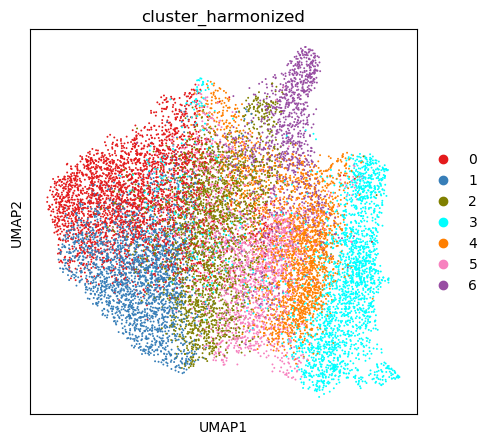

In [55]:
plt.rcParams["figure.figsize"] = (5,5)
sc.pl.umap(ad_im_all, color=['sample'])

ad_im_all.obs['T'] = ad_im_all.obs['sample'].str.split('_', expand=True)[1]
sc.pl.umap(ad_im_all, color=['T'], palette=palette_rna)

sc.pl.umap(ad_im_all, color=['cluster'], palette=palette_rna)
sc.pl.umap(ad_im_all, color=['cluster_harmonized'], palette=palette_rna)

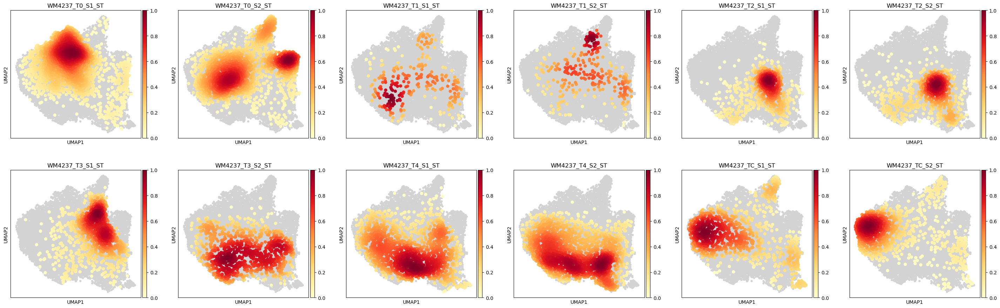

In [56]:
identity = 'sample'
sc.tl.embedding_density(ad_im_all, basis='umap', groupby=identity)
sc.pl.embedding_density(ad_im_all, groupby=identity, ncols=ncols)

In [59]:
images = {id: [(ad_temp := sc.read(preprocessedStDataPath + '%s/st_adata_processed.h5ad' % id)).uns['spatial'], ad_temp.obs.index, ad_temp.obsm['spatial']] for id in ids}

ad_im_all.obs['count_connective'] = ad_im_all.obs['count_connective'].fillna(0).astype(int)
ad_im_all.obs['count_neoplasia'] = ad_im_all.obs['count_neoplasia'].fillna(0).astype(int)

ads = dict()
for sample in ids[:]:
    ads[sample] = ad_im_all[ad_im_all.obs['sample']==sample, :].copy()    
    ads[sample].uns['spatial'] = images[sample][0]
    ads[sample].obsm['spatial'] = pd.DataFrame(index=images[sample][1], data=images[sample][2]).reindex(ads[sample].obs['original_barcode']).values

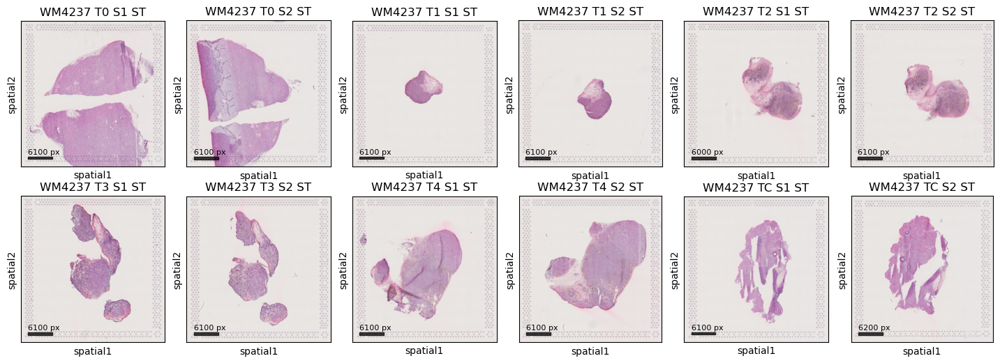

In [60]:
plotSpatialAll(ads, nx=ncols, f=0.6)

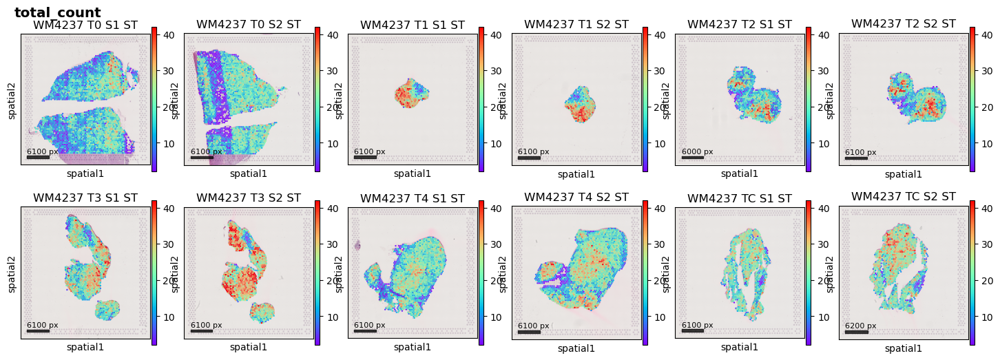

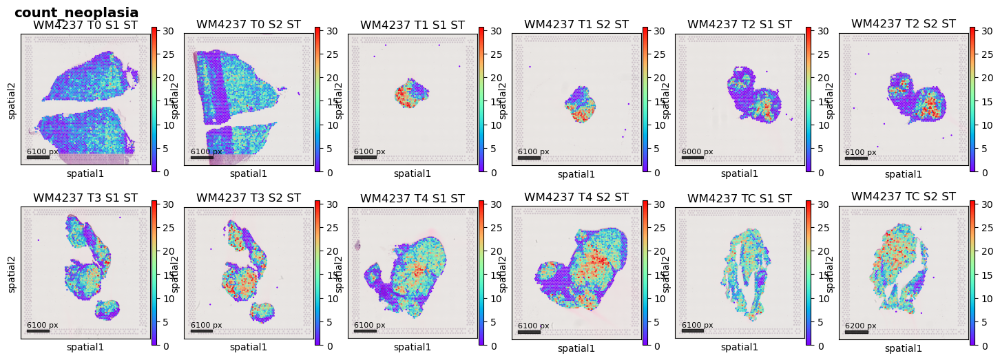

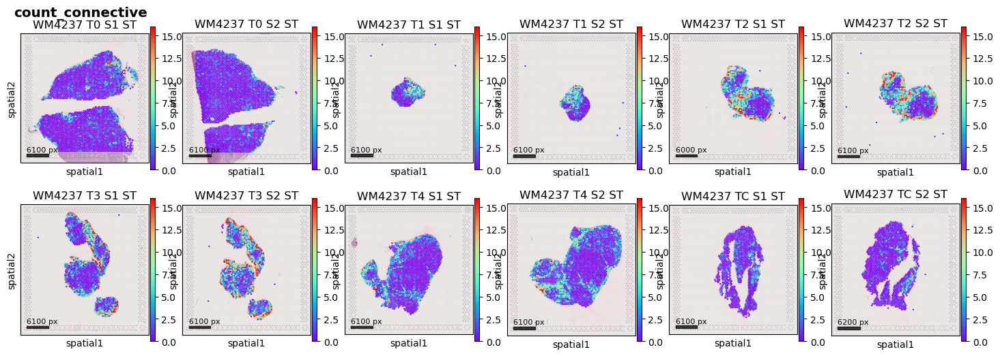

In [61]:
plotSpatialAll(ads, identity='total_count', nx=ncols, maintainScale=False, f=0.6)
plotSpatialAll(ads, identity='count_neoplasia', nx=ncols, f=0.6)
plotSpatialAll(ads, identity='count_connective', nx=ncols, f=0.6)

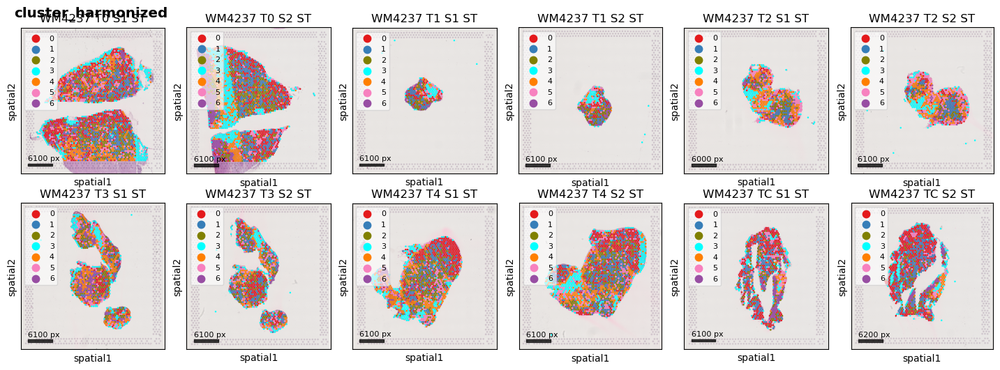

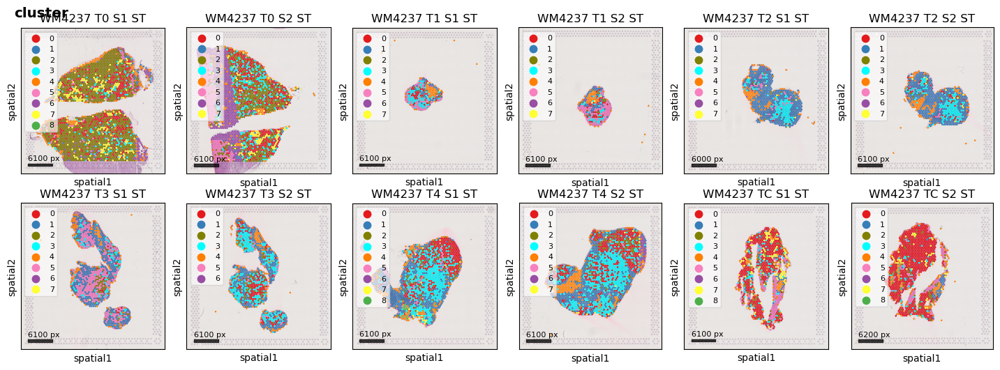

In [62]:
plotSpatialAll(ads, identity='cluster_harmonized', nx=ncols, maintainScale=False, palette=palette_rna, f=0.6)
plotSpatialAll(ads, identity='cluster', nx=ncols, maintainScale=False, palette=palette_rna, f=0.6)

In [63]:
ad_im_all.write(dataPath + 'ad_all_human_clustered_im_st_%s.h5ad' % model)

# Both: Load ST and AD processed objects

In [5]:
ad_im_all = sc.read(dataPath + 'ad_all_human_clustered_im_st_%s.h5ad' % model)

In [7]:
ad_all = sc.read(dataPath + 'ad_all_human_clustered_st_%s.h5ad' % model)
ad_all = ad_all[ad_all.obs['human_ratio']>=0.25]
print(ad_all.shape)

ad_im_all = ad_im_all[ad_all.obs.index.intersection(ad_im_all.obs.index), :]
ad_im_all.obs['rna_cluster'] = ad_all.obs['cluster'].reindex(ad_im_all.obs.index).values
print(ad_im_all.shape)

(18406, 18720)
(14083, 2048)


In [19]:
import pickle
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score

# Features selected by JR
resist_v_sensLineages_DiffImagingFeatures = pd.read_csv('../WM4007/resist_v_sensLineages_DiffImagingFeatures.txt', sep=' ').index
resist_v_sensLineages_DiffImagingFeatures.shape

# # RNA cluster 4 vs 8 for WM4007
# cond = ad_im_all.obs['rna_cluster'].isin(['4', '8'])
# df = ad_im_all[cond].to_df()[resist_v_sensLineages_DiffImagingFeatures]
# se = (ad_im_all.obs['rna_cluster'][cond]=='8').astype(int)
# df.shape, se.shape

# RNA cluster 4 vs 8 for WM4007
cond = ad_im_all.obs['T'].isin(['T1', 'T2', 'T3', 'T4']) & ad_im_all.obs['rna_cluster'].isin(['0', '1', '2', '4', '5', '6'])
df = ad_im_all[cond].to_df()[resist_v_sensLineages_DiffImagingFeatures]
se = (ad_im_all.obs['rna_cluster'][cond].isin(['0', '1', '2', '5', '6'])).astype(int)
print(df.shape, se.shape)

np.random.seed(1)
se0 = se[se==0]
se1 = se[se==1]

ind_train = pd.concat([se0.sample(int(se0.shape[0]*0.8)), se1.sample(int(se1.shape[0]*0.8))]).index
ind_test = se.index.difference(ind_train)

X_train = df.loc[ind_train].values
y_train = se.loc[ind_train].values
print(X_train.shape, y_train.shape)

clf = SVC(C=0.01, kernel='linear', class_weight='balanced', tol=0.0000001, probability=True)
scores = cross_val_score(clf, X_train, y_train, cv=5, scoring='roc_auc')
print('Train cross-validation AUC:', np.round(np.mean(scores), 3), '+-', np.round(np.std(scores), 3), scores)

clf.fit(X_train, y_train)

X_test = df.loc[ind_test].values
y_test = se.loc[ind_test].values
print(X_test.shape, y_test.shape)

# X_test = df.values
# y_test = se.values
# print(X_test.shape, y_test.shape)

# with open('../WM4007/clf_WM4007_77feat_1_prolif.pklz', 'rb') as tempfile:
#     clf, resist_v_sensLineages_DiffImagingFeatures = pickle.load(tempfile)
#     # Test AUC: 0.588 (4 vs rest)
    
print('Test AUC:', np.round(roc_auc_score(y_test, clf.predict(X_test)), 3))

(2697, 77) (2697,)
(2156, 77) (2156,)
Train cross-validation AUC: 0.903 +- 0.024 [0.92926885 0.86309737 0.89578329 0.92389471 0.90249364]
(541, 77) (541,)
Test AUC: 0.808


In [6]:
ad_im_ad_all = sc.read(dataPath + 'ad_all_human_clustered_im_ad_%s_m.h5ad' % model)

In [65]:
ad_all = sc.concat([ad_im_ad_all, ad_im_all], join='outer')
ad_all.obs['T'] = ad_all.obs['sample'].str.split('_', expand=True)[1]
ad_all.obs['Origin'] = ad_all.obs['sample'].str.split('_', expand=True)[3]
ad_all.shape

(31319, 2048)

In [66]:
sc.pp.highly_variable_genes(ad_all, flavor='seurat', batch_key='sample', n_top_genes=250)
sc.pp.pca(ad_all, n_comps=30, zero_center=True, use_highly_variable=True)

In [67]:
sce.pp.harmony_integrate(ad_all, 'Origin', lamb=1.0)

2023-06-05 09:57:14,929 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-06-05 09:57:19,872 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-06-05 09:57:20,056 - harmonypy - INFO - Iteration 1 of 10
2023-06-05 09:57:34,674 - harmonypy - INFO - Iteration 2 of 10
2023-06-05 09:57:48,643 - harmonypy - INFO - Converged after 2 iterations


In [68]:
sc.pp.neighbors(ad_all, use_rep='X_pca_harmony')
sc.tl.umap(ad_all)

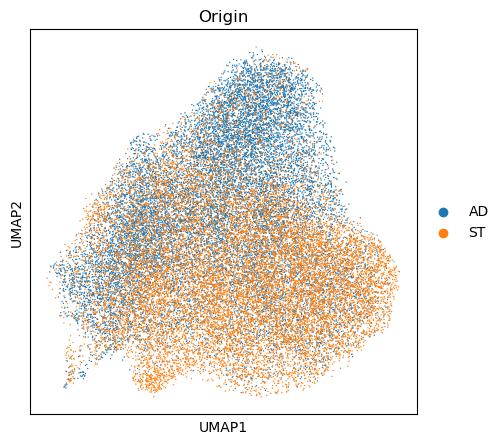

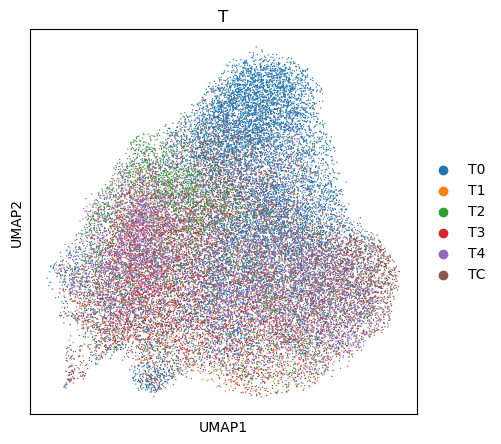

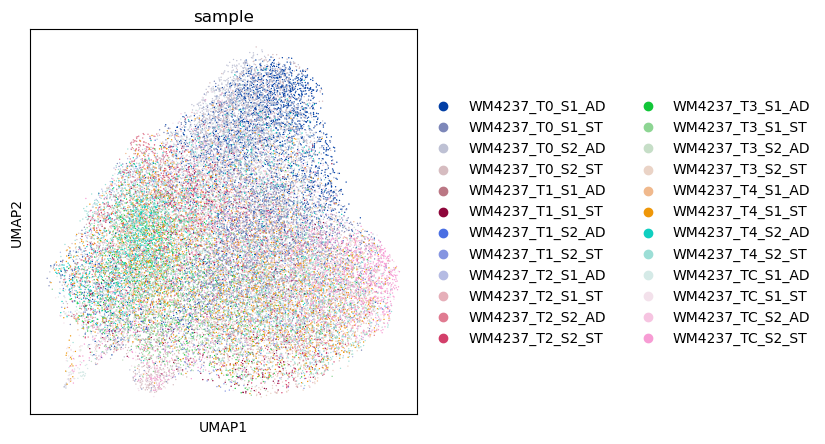

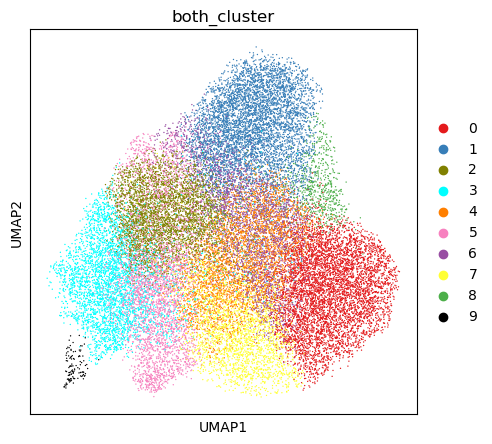

In [69]:
res_im = 1.0
sc.tl.leiden(ad_all, key_added='both_cluster', resolution=res_im)

plt.rcParams["figure.figsize"] = (5,5)
sc.pl.umap(ad_all, color=['Origin'])
sc.pl.umap(ad_all, color=['T'])
sc.pl.umap(ad_all, color=['sample'])
sc.pl.umap(ad_all, color=['both_cluster'], palette=palette_rna)

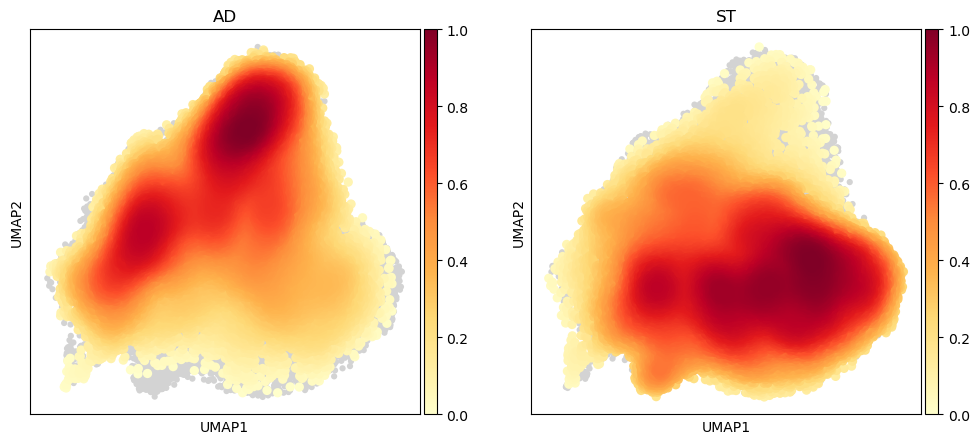

In [70]:
sc.tl.embedding_density(ad_all, basis='umap', groupby='Origin')
sc.pl.embedding_density(ad_all, groupby='Origin', ncols=10)

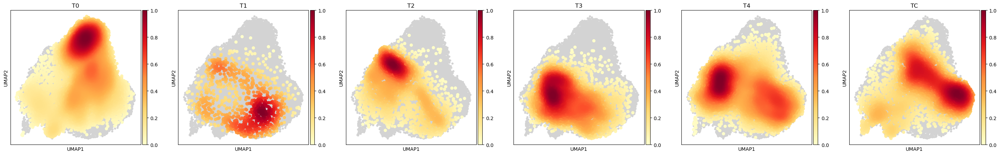

In [71]:
ad_all.obs['T'] = ad_all.obs['sample'].str.split('_', expand=True)[1]
sc.tl.embedding_density(ad_all, basis='umap', groupby='T')
sc.pl.embedding_density(ad_all, groupby='T', ncols=10)